In [2]:
import pandas as pd
import pyarrow.parquet as pq

parquet_file = pq.ParquetFile('../data/train/train.parquet')
# parquet_file = pq.ParquetFile('../data/train/attributes.parquet')
# parquet_file = pq.ParquetFile('../data/train/resnet.parquet')
# parquet_file = pq.ParquetFile('../data/train/text_and_bert.parquet')

for batch in parquet_file.iter_batches():
    print('')
    batch_df = batch.to_pandas()
    print(batch_df.head())


   variantid1  variantid2  target
0  1447875869  1447872068       1
1  1176231201   284733670       1
2   658617865   549848659       0
3   719320625   719370486       1
4  1067645658   949954740       0

   variantid1  variantid2  target
0   498785428   498789568       1
1  1412079332  1438684510       1
2  1214517579  1214482217       0
3  1101440269  1087602441       1
4   709685959   695165818       0

   variantid1  variantid2  target
0  1520835734  1517550019       0
1  1157199507  1497486804       0
2  1467052821  1542349173       1
3  1089016814  1067684732       1
4  1552733507  1552731970       0

   variantid1  variantid2  target
0  1262925383  1262925397       0
1   941550495   853623373       0
2  1522620140  1518808297       0
3   420269996  1097475748       1
4   886499617   886486366       0

   variantid1  variantid2  target
0   838353214   838336374       1
1  1512879321  1552590033       1
2   718609470   611313928       1
3  1158889875   467041799       0
4  134198

In [3]:
parquet_file.metadata

  created_by: parquet-cpp-arrow version 12.0.0
  num_columns: 3
  num_rows: 1168516
  num_row_groups: 1
  format_version: 2.6
  serialized_size: 2498

In [4]:
parquet_file.metadata.num_rows

1168516

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..')))
from src.main import read_parquet_in_batches

In [3]:
df_train = pd.read_parquet('../data/train/train.parquet')

In [6]:
df_attributes = pd.read_parquet('../data/train/attributes.parquet')

In [9]:
df_train.head()

,variantid1,variantid2,target
0,1447875869,1447872068,1
1,1176231201,284733670,1
2,658617865,549848659,0
3,719320625,719370486,1
4,1067645658,949954740,0


In [5]:
df_train.shape

(1168516, 3)

In [7]:
df_attributes.shape

(2252569, 3)

In [8]:
df_attributes.head()

,variantid,categories,characteristic_attributes_mapping
0,47920382,"{""1"": ""EPG"", ""2"": ""Детские товары"", ""3"": ""Игру...","{""Цвет товара"": [""бежевый"", ""светло-розовый""],..."
1,49801845,"{""1"": ""EPG"", ""2"": ""Хобби и творчество"", ""3"": ""...","{""Количество в упаковке, шт"": [""1""], ""Бренд"": ..."
2,49853444,"{""1"": ""EPG"", ""2"": ""Хобби и творчество"", ""3"": ""...","{""Бренд"": [""Vervaco""], ""Тип"": [""Набор для выши..."
3,49893028,"{""1"": ""EPG"", ""2"": ""Хобби и творчество"", ""3"": ""...","{""Цвет товара"": [""серый""], ""Ширина, см"": [""0.8..."
4,49987483,"{""1"": ""EPG"", ""2"": ""Хобби и творчество"", ""3"": ""...","{""Цвет товара"": [""разноцветный""], ""Название цв..."


In [41]:
from collections import Counter
import numpy as np

arr = np.concatenate((np.array(df_train['variantid1']), np.array(df_train['variantid2'])))

In [44]:
arr.shape

(2337032,)

Подсчитаем сколько раз каждый Id появлялся в train

In [45]:
counter = Counter(arr)

In [46]:
counter

Counter({1241876485: 15,
         1265099536: 12,
         1070894875: 12,
         1266381081: 11,
         1265084353: 11,
         1265104572: 11,
         1536275748: 11,
         1242432196: 10,
         1265088475: 10,
         640073135: 10,
         884804491: 9,
         822713756: 9,
         1070873344: 9,
         1070872843: 9,
         1059325286: 9,
         641161250: 9,
         1549510105: 9,
         866798974: 9,
         640069313: 9,
         1516143135: 8,
         1022435077: 8,
         1249745887: 8,
         67981840: 8,
         1243674510: 8,
         1320401485: 8,
         1265076886: 8,
         1536369238: 8,
         1535470471: 8,
         1153980642: 8,
         1562282267: 8,
         866799019: 8,
         146252329: 8,
         1265077069: 8,
         1499026289: 8,
         1079789132: 8,
         1050280573: 8,
         1499024780: 8,
         1032815891: 8,
         1227897005: 8,
         1103996560: 8,
         1328528371: 8,
         1549507

In [53]:
df_train.shape[0]

1168516

Поместим все одинаковые товары в один сет

In [60]:
list_of_sets = []
set_mapping = {}  # Dictionary to map each variantid to its set

for index, row in df_train.iterrows():
    print(f'{(index / df_train.shape[0]*100):.2f}%')
    if row['target'] == 1:
        s1 = set_mapping.get(row['variantid1'])
        s2 = set_mapping.get(row['variantid2'])

        if s1 is not None and s2 is not None:
            if s1 != s2:  # If both ids are in different sets, merge them
                s1.update(s2)  # Merge s2 into s1
                for variantid in s2:
                    set_mapping[variantid] = s1  # Update mapping to point to the merged set
                list_of_sets.remove(s2)
        elif s1 is not None:
            s1.add(row['variantid2'])
            set_mapping[row['variantid2']] = s1
        elif s2 is not None:
            s2.add(row['variantid1'])
            set_mapping[row['variantid1']] = s2
        else:
            new_set = {row['variantid1'], row['variantid2']}
            list_of_sets.append(new_set)
            set_mapping[row['variantid1']] = new_set
            set_mapping[row['variantid2']] = new_set


0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00%
0.00

Сколько групп одинаоквых товаров

In [61]:
print(len(list_of_sets))

509740


In [62]:
list_of_sets = sorted(list_of_sets, key=len)

Самая большая группа одинаковых товаров

In [64]:
print(list_of_sets[-1])

{4099615265, 3930964041, 4139503434, 4157301901, 4172422447, 1328528371, 4119070645, 4120473558, 4124358552}


Посмотрим сколько групп каждого количества

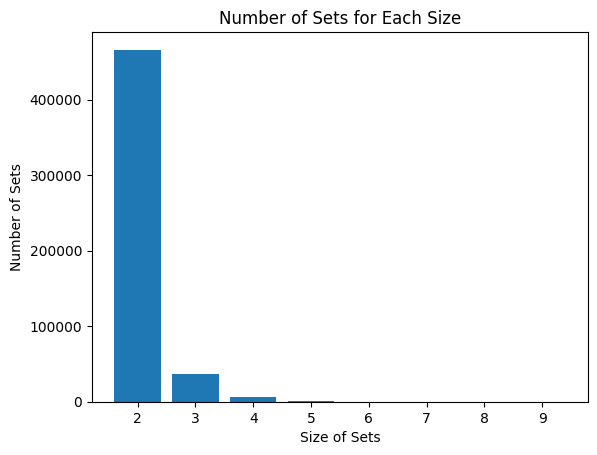

In [65]:
# Calculate the size of each set
set_sizes = [len(s) for s in list_of_sets]

# Count the occurrences of each size
size_counts = Counter(set_sizes)

# Create lists of sizes and their counts
sizes = list(size_counts.keys())
counts = list(size_counts.values())

# Plotting the bar chart
plt.bar(sizes, counts)
plt.xlabel('Size of Sets')
plt.ylabel('Number of Sets')
plt.title('Number of Sets for Each Size')
plt.xticks(sizes)  # Set x-ticks to the sizes for clarity
plt.show()

Посмотрим на частные случаи

№1

In [66]:
list_of_sets[0]

{1447872068, 4343620005}

In [80]:
df_attributes[df_attributes['variantid']==1447872068]['categories'].values

array(['{"1": "Одежда и обувь", "2": "Одежда", "3": "Одежда", "4": "Свитер, джемпер"}'],
      dtype=object)

In [86]:
df_attributes[df_attributes['variantid']==4343620005]['categories'].values

array([], dtype=object)

№2

In [87]:
list_of_sets[1]

{284733670, 1745698541}

In [88]:
df_attributes[df_attributes['variantid']==284733670]['categories'].values

array(['{"1": "EPG", "2": "Товары для взрослых", "3": "БДСМ", "4": "Наручники и фиксаторы"}'],
      dtype=object)

In [89]:
df_attributes[df_attributes['variantid']==1745698541]['categories'].values

array([], dtype=object)

№3

In [90]:
list_of_sets[-1]

{1328528371,
 3930964041,
 4099615265,
 4119070645,
 4120473558,
 4124358552,
 4139503434,
 4157301901,
 4172422447}

In [93]:
df_attributes[df_attributes['variantid']==1328528371]['categories'].values

array(['{"1": "Одежда и обувь", "2": "Одежда", "3": "Аксессуары", "4": "Шапка"}'],
      dtype=object)

In [97]:
df_attributes[df_attributes['variantid']==4099615265]['categories'].values

array([], dtype=object)